In [353]:
import os
import torch
import torchaudio
from IPython.display import Audio
import numpy as np
from scipy.fft import fft, ifft
import matplotlib.pyplot as plt
import pandas as pd

In [227]:
wav_path = '/Users/ginoprasad/autotune/m4a_files/titanic.m4a'

In [231]:
wav, sample_rate = torchaudio.load(wav_path)
wav = wav[0]
wav = wav[230000:]
Audio(wav, rate=sample_rate)

In [232]:
N = len(wav)

In [233]:
sample_rate

32000

# Note Frequencies

In [236]:
prelim_notes_octave = 4
prelim_notes = [("C", 261.63), ("C#", 277.18), ("D", 293.66), ("D#", 311.13),
         ("E", 329.63), ("F", 349.23), ("F#", 369.99), ("G", 392.00), ("G#", 415.30), ("A", 440.00), ("A#", 466.16), ("B", 493.88), ]
prelim_notes

[('C', 261.63),
 ('C#', 277.18),
 ('D', 293.66),
 ('D#', 311.13),
 ('E', 329.63),
 ('F', 349.23),
 ('F#', 369.99),
 ('G', 392.0),
 ('G#', 415.3),
 ('A', 440.0),
 ('A#', 466.16),
 ('B', 493.88)]

In [327]:
notes = [(freq * (2 ** (octave - prelim_notes_octave)), f"{name}{octave}") for octave in range(3, 6) for name, freq in prelim_notes]
pd.DataFrame(notes)

,0,1
0,130.815,C3
1,138.590,C#3
2,146.830,D3
3,155.565,D#3
4,164.815,E3
5,174.615,F3
6,184.995,F#3
7,196.000,G3
8,207.650,G#3
9,220.000,A3


In [328]:
kmer = 0.15 # seconds

In [350]:
coeff = 0.25

In [351]:
processed_audio = []
for i in range(0, len(wav), int(kmer * sample_rate)):
    wav_slice = wav[i:i + int(kmer * sample_rate)]
    N = len(wav_slice)
    fourier_transform = fft(wav_slice.numpy())
    
    ret = fourier_transform.copy()
    assert len(amplitudes) == len(notes)
    
    prev = notes[0][0]
    for i, (note, _) in enumerate(notes):
        next_note = notes[i+1][0] if i+1 < len(notes) else threshold
        index = int(note * N / sample_rate)
        if index >= len(ret):
            continue
        
        s, e = (prev * (1-coeff)) + (note * coeff), (next_note * (1-coeff)) + (note * coeff)
        s, e = int((N * s) / sample_rate), int((N * e) / sample_rate)
        amp = np.sum(np.absolute(fourier_transform[s:e]))

        ret[s:e] = 0
        ret[index] = amp
        prev = note
    
#     ret[int(notes[-1][0] * N * 5 / sample_rate):] = fourier_transform[int(notes[-1][0] * N * 5 / sample_rate):]
#     ret[:int(notes[0][0] * N / sample_rate)] = fourier_transform[:int(notes[0][0] * N / sample_rate)]

    
    processed_wav_slice = np.real(ifft(ret))
    processed_audio.append(processed_wav_slice)
processed_audio = np.concatenate(processed_audio)

In [352]:
Audio(processed_audio, rate=sample_rate)

In [316]:
len(processed_wav_slice)

3408

In [255]:
Audio(processed_audio, rate=sample_rate)

In [244]:
Audio(wav, rate=sample_rate)

/Users/ginoprasad/miniconda3/envs/torch-gpu/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1369: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


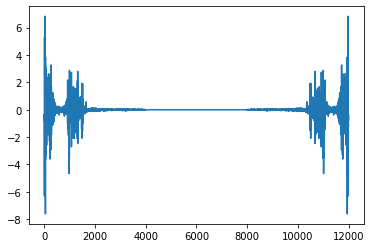

In [173]:
plt.plot(fourier_transform)

In [97]:
Audio(wav_slice, rate=sample_rate)